Residential Streets: Typically range from 18 to 36 feet (5.5 to 11 meters) wide, accommodating one or two lanes of traffic, along with parking on one or both sides.

Collector Streets: These are slightly wider, often ranging from 36 to 48 feet (11 to 14.5 meters), designed to handle more traffic and may include bike lanes.

Arterial Streets: These are main roads that handle heavy traffic and can range from 48 to 80 feet (14.5 to 24 meters) or more, with multiple lanes and possibly a median.

Highways and Boulevards: These can be even wider, often exceeding 100 feet (30 meters) to accommodate several lanes of traffic in each direction, medians, and shoulders.

In [3]:
!pip install sweetviz

In [4]:
import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook]
!pip install jupyter-contrib-nbextensions

In [5]:
!pip install ipywidgets

## Loading the data
We can now load the dataset into pandas using the read_csv() function. This converts the CSV file into a Pandas dataframe.

In [8]:
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from ydata_profiling import ProfileReport
import sweetviz as sv

 
## This statement allows the visuals to render within your Jupyter Notebook.
%matplotlib inline

In [109]:
df1 = pd.read_csv(r"C:\Users\gharb\OneDrive\Desktop\Datasets\Riyadh\realEstate.csv")

### Viewing the dataframe
We can get a quick sense of the size of our dataset by using the shape method. This returns a tuple with the number of rows and columns in the dataset.

In [93]:
profile = ProfileReport(df1, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1. Data Profiling:
Data profiling is a comprehensive process of examining the data available in an existing dataset and collecting statistics and information about that data. 

In [39]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3414 entries, 2 to 6761
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   user_id          3414 non-null   int64  
 1   id               3414 non-null   int64  
 2   price            3414 non-null   int64  
 3   beds             3414 non-null   int64  
 4   livings          3414 non-null   float64
 5   wc               3414 non-null   int64  
 6   area             3414 non-null   float64
 7   street_width     3414 non-null   float64
 8   age              3414 non-null   float64
 9   ketchen          3414 non-null   object 
 10  ac               3414 non-null   object 
 11  furnished        3414 non-null   object 
 12  district         3414 non-null   object 
 13  width            3414 non-null   float64
 14  length           3414 non-null   float64
 15  advertiser_type  3414 non-null   object 
 16  review           3414 non-null   float64
 17  onMarket         34

In [41]:
df1.describe()

,user_id,id,price,beds,livings,wc,area,street_width,age,width,length,review,onMarket
count,3.414000e+03,3.414000e+03,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000,3414.000000
mean,1.365990e+06,4.482817e+06,43374.058582,2.580551,1.001465,2.094610,144.643820,24.717047,1.852665,11.678937,12.226054,4.129092,47.210603
std,8.242533e+05,1.482925e+05,21493.515953,1.090586,0.435393,0.924397,55.773334,7.564212,2.036359,2.907418,2.849050,1.005061,49.328374
min,7.000000e+00,1.269068e+06,136.000000,1.000000,0.000000,1.000000,8.000000,10.000000,0.000000,5.000000,5.000000,0.000000,1.000000
25%,6.452272e+05,4.451006e+06,26000.000000,2.000000,1.000000,1.000000,100.000000,20.000000,0.000000,10.000000,11.000000,4.080000,19.000000
50%,1.472688e+06,4.529282e+06,37000.000000,3.000000,1.000000,2.000000,150.000000,23.000000,1.000000,11.000000,12.000000,4.350000,33.000000
75%,2.072661e+06,4.573544e+06,60000.000000,3.000000,1.000000,3.000000,180.000000,30.000000,3.000000,12.000000,13.000000,4.540000,60.000000
max,2.683775e+06,4.600241e+06,95000.000000,7.000000,3.000000,5.000000,300.000000,40.000000,7.000000,20.000000,20.000000,5.000000,1363.000000


In [43]:
df1.shape

(3414, 19)

In [45]:
df1.columns

Index(['user_id', 'id', 'price', 'beds', 'livings', 'wc', 'area',
       'street_width', 'age', 'ketchen', 'ac', 'furnished', 'district',
       'width', 'length', 'advertiser_type', 'review', 'onMarket', 'IsRent'],
      dtype='object')

### 2. Data Quality Checks
Data quality checks involve the process of ensuring that the data is accurate, complete, consistent, relevant, and reliable. 


**Here are typical steps involved in checking data quality:**

#### 1. Reliability:
Evaluate the data's source and collection process to determine its trustworthiness.

We chose this dataset because it is available from a trusted platform, "Aqar." Aqar is a platform operated by Aqar Commercial Company, which is registered in the Kingdom of Saudi Arabia and manages and operates the platform's services. It is a reliable platform.

#### 2. Timeliness: 
Ensure the data is up-to-date and reflective of the current situation or the period of interest for the analysis.

The dataset for apartments in Riyadh is from 2022, which is relatively recent and suitable for our analysis, ensuring that the insights drawn are relevant.

#### 3. Consistency: 

Confirm that the data is consistent within the dataset and across multiple data sources. For example, the same data point should not have different values in different places.


### We standardized the data types across the dataset to ensure consistency. Specifically:
1- Changed the data type of each column to the most suitable one .


2 - (converting numerical data stored as text to float).


3 - Converted binary data (0 and 1) to more meaningful labels (Yes and No).


4 - Transformed columns with object data types to float where appropriate, ensuring that all numerical values are properly formatted and ready for analysis.


#### 4. Relevance: 
Assess whether the data is appropriate and applicable for the intended analysis. Data that is not relevant can skew results and lead to incorrect conclusions.

**Key considerations for relevance include:**

> 1. Sample Appropriateness: Confirm that your data sample aligns with your analysis objectives. For instance, utilizing data from the Northern region will not yield accurate insights for the Western region of the Kingdom.
>
> 2. Variable Selection: Any column will not be relevant for our analysis, we can get rid of these using the drop() method. We will set the “axis” argument to 1 since we’re dealing with columns, and set the “inplace” argument to True to make the change permanent.

In [111]:
df1.drop(columns='imgs' , axis = 1 , inplace = True)
df1.drop(columns='location' , axis = 1 , inplace = True)
df1.drop(columns='profileImg' , axis = 1 , inplace = True)
df1.drop(columns='iam_verified' , axis = 1 , inplace = True) 
df1.drop(columns='UserName' , axis = 1 , inplace = True) 
df1.drop(columns='create_time' , axis = 1 , inplace = True) 
df1.drop(columns='last_update' , axis = 1 , inplace = True)
df1.drop(columns='refresh' , axis = 1 , inplace = True) 
df1.drop(columns='content' , axis = 1 , inplace = True) 
df1.drop(columns='path' , axis = 1 , inplace = True) 
df1.drop(columns='title' , axis = 1 , inplace = True) 

#### 5. Uniqueness: 
Check for and remove duplicate records to prevent skewed analysis results.

In [68]:
df1[df1.duplicated()]

,User Id,ID,Price,Bed Rooms,Living Rooms,WC,Area,Street Width,Build Age,Ketchen,AC,Furnished,District,Width,Length,Advertiser Type,Review,onMarket,IsRent


#### 6. Completeness: 
Ensure that no critical data is missing. This might mean checking for null values or required fields that are empty.

We will start by checking the dataset for missing or null values. For this, we can use the isna() method which returns a dataframe of boolean values indicating if a field is null or not. To group all missing values by column, we can include the sum() method.

In [70]:
df1.isnull().sum()

User Id               0
ID                    0
Price                 0
Bed Rooms             0
Living Rooms          2
WC                    0
Area                175
Street Width        210
Build Age           705
Ketchen              17
AC                   19
Furnished            45
District              0
Width              2100
Length             2100
Advertiser Type     240
Review              399
onMarket              0
IsRent                0
dtype: int64

#### 7. Check Accuracy:

Verify that the data is correct and precise. This could involve comparing data samples with known sources or using validation rules.

**The process includes:**
1. Validating the appropriateness of data types for the dataset.
2. Identifying outliers  using established validation  rule

In [72]:
df1.dtypes

User Id              int64
ID                   int64
Price                int64
Bed Rooms            int64
Living Rooms       float64
WC                   int64
Area               float64
Street Width       float64
Build Age          float64
Ketchen            float64
AC                 float64
Furnished          float64
District            object
Width              float64
Length             float64
Advertiser Type     object
Review             float64
onMarket             int64
IsRent                bool
dtype: object

#### 7. Check Accuracy:

Verify that the data is correct and precise. This could involve comparing data samples with known sources or using validation rules.

**The process includes:**
1. Validating the appropriateness of data types for the dataset.
2. Identifying outliers  using established validation  rule

## 2. Data Cleaning: 

Preliminary findings from data profiling can lead to cleaning the data by:
- Handling missing values
- Correcting errors.
- Dealing with outliers.

## Outlier 

In [123]:
advert_report = sv.analyze(df1)
advert_report.show_html('Advertising.html')

                                             |          | [  0%]   00:00 -> (? left)

Report Advertising.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Price 

In [679]:
Q1 = df1['price'].quantile(0.25)
Q3 = df1['price'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['price'] < lower_bound) | (df1['price'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent
77,366114,4570907,120000,3,2.0,3,150.0,20.0,1.0,Yes,Yes,No,حي الملقا,15.0,10.0,exclusive_marketer,3.73,24,False
93,1168006,4370488,130000,5,2.0,4,250.0,25.0,0.0,Yes,Yes,Yes,حي الملقا,10.0,25.0,exclusive_marketer,4.69,83,False
94,109604,4457540,120000,3,1.0,3,140.0,30.0,0.0,No,Yes,No,حي القيروان,10.0,14.0,normal_marketer,4.34,60,False
102,158296,4339151,135000,2,1.0,2,100.0,36.0,4.0,Yes,Yes,Yes,حي الربيع,11.0,12.0,agent,4.57,92,False
183,120924,4548462,120000,3,2.0,4,250.0,40.0,0.0,Yes,Yes,No,حي الملقا,15.0,16.0,exclusive_marketer,4.54,30,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6623,1350258,4524075,150000,2,1.0,3,150.0,5.0,1.0,Yes,Yes,Yes,حي الملقا,20.0,7.0,agent,0.00,31,True
6625,692078,4489526,250000,3,1.0,2,218.0,20.0,3.0,Yes,No,No,حي المونسية,11.0,12.0,normal_marketer,4.24,40,True
6668,454504,4548892,140000,4,1.0,4,265.0,5.0,1.0,Yes,Yes,Yes,حي الملقا,10.0,26.0,owner,5.00,30,False
6670,403394,4543139,220000,3,0.0,2,120.0,5.0,3.0,Yes,Yes,No,حي الشهداء,12.0,10.0,exclusive_marketer,4.36,18,True


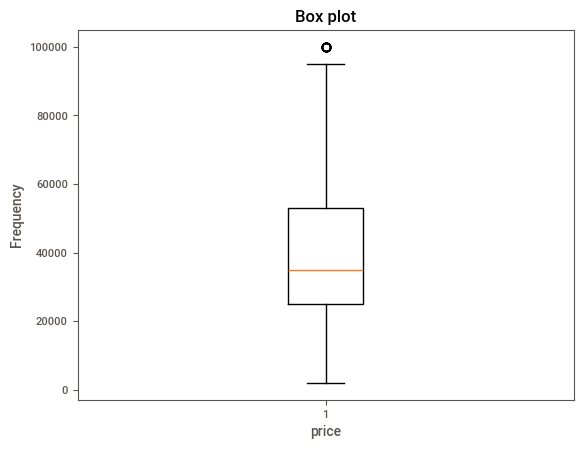

In [121]:
plt.boxplot(df1['price'])
plt.xlabel('price')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [119]:
# df1 = df1[df1['price'] < 165000]
df1 = df1[(df1['price'] <= 100000) & (df1['price'] >= 2000)]

### Area

In [693]:
Q1 = df1['area'].quantile(0.25)
Q3 = df1['area'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['area'] < lower_bound) | (df1['area'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent
6,120924,4560144,85000,3,2.0,5,600.0,25.0,0.0,Yes,Yes,No,حي الملقا,16.0,37.0,exclusive_marketer,4.54,27,False
14,2651072,4548914,28000,3,1.0,2,450.0,15.0,3.0,No,No,No,حي المونسية,20.0,22.0,agent,0.00,26,True
17,1006015,4597848,50000,5,1.0,4,500.0,15.0,7.0,Yes,Yes,Yes,حي القيروان,11.0,12.0,normal_marketer,3.94,6,True
28,2447166,4558003,90000,3,1.0,3,900.0,30.0,0.0,Yes,Yes,No,حي القيروان,30.0,30.0,normal_marketer,4.17,28,False
71,750006,4598300,30000,3,1.0,2,400.0,5.0,5.0,Yes,Yes,Yes,حي القيروان,10.0,40.0,owner,5.00,4,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6661,79506,4517841,15000,1,0.0,1,2222.0,5.0,3.0,Yes,No,No,حي اليرموك,222.0,10.0,normal_marketer,3.67,31,True
6669,21154,4551416,30000,5,1.0,2,650.0,20.0,5.0,Yes,No,No,حي الخليج,25.0,26.0,exclusive_marketer,4.43,29,False
6687,1033943,4353868,50000,3,1.0,4,375.0,10.0,1.0,Yes,Yes,Yes,حي النرجس,15.0,25.0,agent,4.37,88,False
6719,127681,4594282,28000,3,1.0,2,420.0,5.0,5.0,Yes,Yes,No,حي اليرموك,20.0,21.0,agent,3.94,18,False


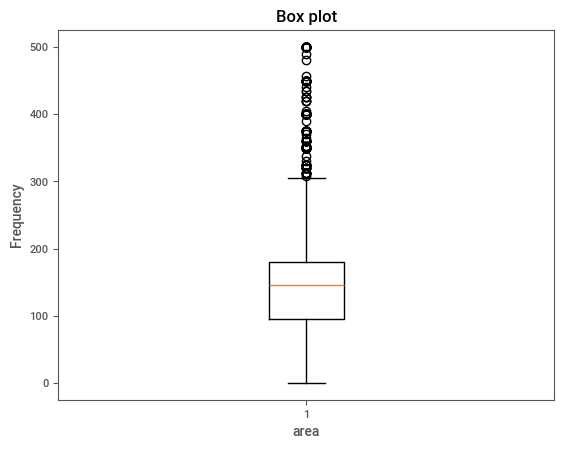

In [739]:
plt.boxplot(df1['area'])
plt.xlabel('area')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [26]:
#df1 = df1[df1['area'] < 200000]
# df1 = df1[df1['area'] < 25000]
# df1 = df1[df1['area'] < 10000]
# df1 = df1[df1['area'] < 2000]
# df1 = df1[df1['area'] <= 1250]
df1 = df1[(df1['area'] <= 300) & (df1['area'] >= 5.5)]

### Street width

In [787]:
Q1 = df1['street_width'].quantile(0.25)
Q3 = df1['street_width'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['street_width'] < lower_bound) | (df1['street_width'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent


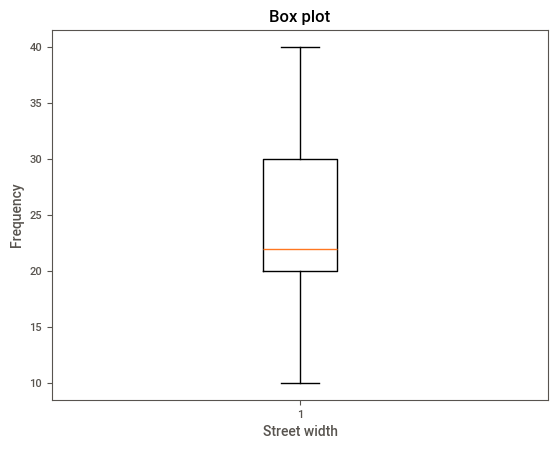

In [785]:
plt.boxplot(df1['street_width'])
plt.xlabel('Street width')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [24]:
# df1 = df1[df1['street_width'] <= 60]
# df1 = df1[(df1['street_width'] <= 50) & (df1['street_width'] >= 5.5)]
df1 = df1[(df1['street_width'] <= 40) & (df1['street_width'] >= 10)]

### Age

In [803]:
Q1 = df1['age'].quantile(0.25)
Q3 = df1['age'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['age'] < lower_bound) | (df1['age'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent


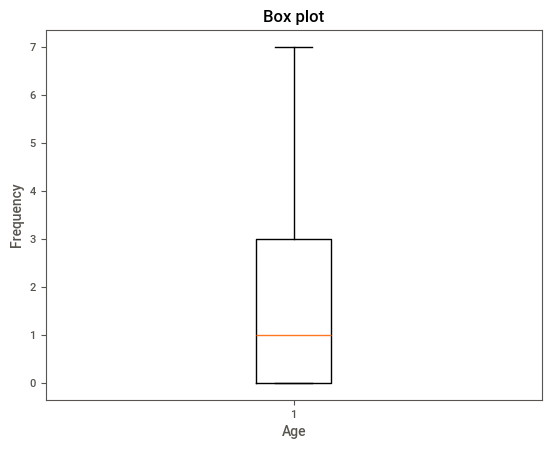

In [801]:
plt.boxplot(df1['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [22]:
df1 = df1[(df1['age'] <= 7)]

### Width

In [823]:
Q1 = df1['width'].quantile(0.25)
Q3 = df1['width'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['width'] < lower_bound) | (df1['width'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent
11,1049794,4498768,27000,2,1.0,1,8.0,29.0,0.0,Yes,Yes,No,حي اليرموك,1.0,9.0,normal_marketer,4.40,36,True
27,6587,4576362,28000,1,0.0,1,40.0,29.0,1.0,Yes,Yes,No,حي الملقا,4.0,10.0,agent,4.11,12,True
30,755116,4501021,89000,3,1.0,3,240.0,36.0,3.0,Yes,Yes,No,حي الياسمين,1.0,240.0,agent,5.00,47,False
40,2194407,4360268,60000,4,1.0,3,170.0,36.0,0.0,No,No,No,حي المونسية,20.0,20.0,normal_marketer,4.79,86,False
57,2371689,4573878,24000,2,0.0,1,160.0,18.0,1.0,Yes,Yes,No,حي العارض,18.0,8.0,agent,5.00,9,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6735,988353,4588046,75000,2,1.0,3,212.0,20.0,0.0,Yes,Yes,No,حي القيروان,1.0,212.0,owner,4.36,18,True
6740,276956,4598269,15000,1,0.0,1,25.0,30.0,3.0,No,No,No,حي الياسمين,5.0,5.0,agent,3.67,17,False
6756,381190,4454853,26000,3,1.0,2,140.0,20.0,5.0,No,No,No,حي اليرموك,20.0,7.0,agent,4.29,59,True
6760,120924,4586116,40000,2,2.0,2,200.0,15.0,1.0,Yes,Yes,No,حي النرجس,20.0,10.0,exclusive_marketer,4.54,20,False


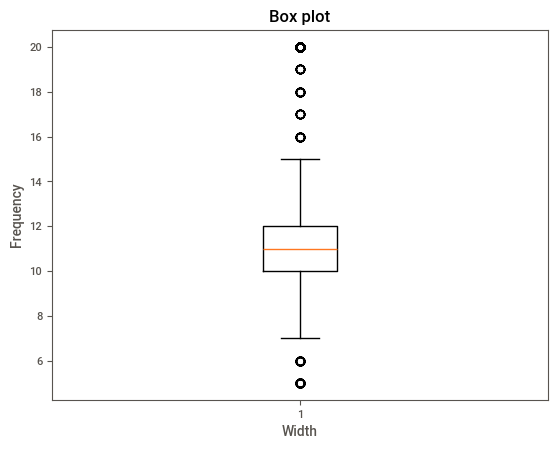

In [910]:
plt.boxplot(df1['width'])
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [20]:
# df1 = df1[(df1['width'] <= 60)]
# df1 = df1[(df1['width'] <= 30)]
df1 = df1[(df1['width'] <= 20) & (df1['width'] >= 5)]

### Length

In [904]:
Q1 = df1['length'].quantile(0.25)
Q3 = df1['length'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1[(df1['length'] < lower_bound) | (df1['length'] > upper_bound)]

,user_id,id,price,beds,livings,wc,area,street_width,age,ketchen,ac,furnished,district,width,length,advertiser_type,review,onMarket,IsRent
2,2412431,4554519,22000,3,1.0,2,200.0,25.0,3.0,No,No,No,حي الرمال,10.0,20.0,normal_marketer,4.67,15,True
8,82582,4553282,28000,3,1.0,2,200.0,18.0,5.0,No,No,No,حي المونسية,10.0,20.0,exclusive_marketer,4.38,29,False
16,1499270,4447853,22000,1,0.0,1,40.0,20.0,5.0,Yes,Yes,No,حي الحمراء,9.0,5.0,normal_marketer,4.35,63,False
19,120924,4485736,78000,4,1.0,3,200.0,30.0,0.0,Yes,Yes,No,حي النرجس,10.0,20.0,exclusive_marketer,4.54,52,False
21,383816,4541526,30000,1,1.0,1,50.0,15.0,5.0,Yes,Yes,No,حي الوزارات,8.0,6.0,owner,4.04,32,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6709,2137705,4549460,70000,3,1.0,2,180.0,16.0,0.0,Yes,Yes,No,حي النرجس,10.0,18.0,normal_marketer,4.06,30,False
6722,1493473,4529945,35000,4,1.0,2,180.0,17.0,2.0,Yes,No,No,حي الملك فيصل,10.0,18.0,normal_marketer,4.31,35,False
6740,276956,4598269,15000,1,0.0,1,25.0,30.0,3.0,No,No,No,حي الياسمين,5.0,5.0,agent,3.67,17,False
6746,1837834,4590893,27000,2,1.0,2,70.0,40.0,3.0,Yes,No,No,حي الملز,10.0,7.0,exclusive_marketer,4.50,15,True


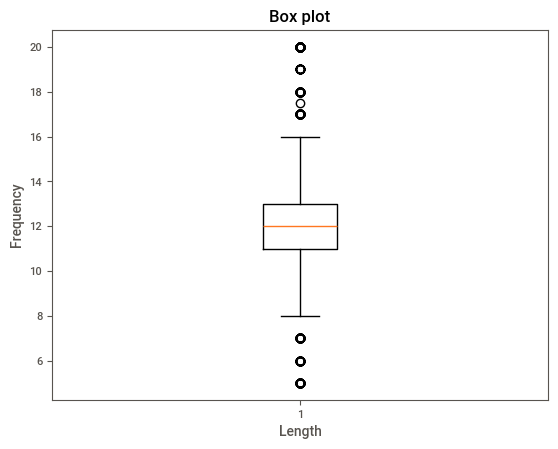

In [902]:
plt.boxplot(df1['length'])
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.title(f'Box plot')
plt.show()

In [18]:
# df1 = df1[(df1['length'] <= 60)]
# df1 = df1[(df1['length'] <= 30)]
df1 = df1[(df1['length'] <= 20) & (df1['length'] >= 5)]

### Correcting errors

-------------------

In [95]:
df1['price'][(df1['area'].isnull()) & (df1['price'] < 100000)].mean() # 32937.57396449704

df1['price'][(df1['area'].isnull())].mean() #37208.28571428572

df1['area'][df1['price'] < 35000].mean() #218.95294875926524

print(df1['width'].median())
print(df1['length'].median())

11.0
12.0


### after caluclate the mean area for null value and caluclate the median for width and length for the a dataset

In [96]:
df1[(df1['length'].isnull())] 
df1['area'][(df1['length'].isnull()) & (df1['width'].isnull())].mean()

145.47272727272727

### we convert the type of ac , furnished , ketchen from float to object and we replace every 1 to True and every 0 to False and every nan to unknown 
### قمنا بحساب متوسط الاسعار في البيانات التي لا تحتوي على عمر وكانت القيمة 39000 ثم قمنا بحساب متوسط اعمار المباني التي كانت لها اسعار اقل من 39000 

In [115]:
# df1['ac'] = df1['ac'].map(lambda x : 'Yes' if x == 1.0 else('No' if x == 0.0 else 'Unknown'))
# df1['furnished'] = df1['furnished'].map(lambda x : 'Yes' if x == 1.0 else('No' if x == 0.0 else 'Unknown'))
# df1['ketchen'] = df1['ketchen'].map(lambda x : 'Yes' if x == 1.0 else('No' if x == 0.0 else 'Unknown'))
# df1['advertiser_type'] = df1['advertiser_type'].fillna('Unknown')
# df1['review'] = df1['review'].fillna(0.0)
# df1['livings'].fillna(1.0 , inplace = True)
# df1['age'].fillna(3.0 , inplace = True)
# df1['street_width'].fillna(20.0 , inplace = True)
# df1['area'].fillna(218.0 , inplace = True)
# df1['width'].fillna(11.0 , inplace = True)
# df1['length'].fillna(12.0 , inplace = True)

## 3,4. Univariate and Bivariate/Multivariate Analysis


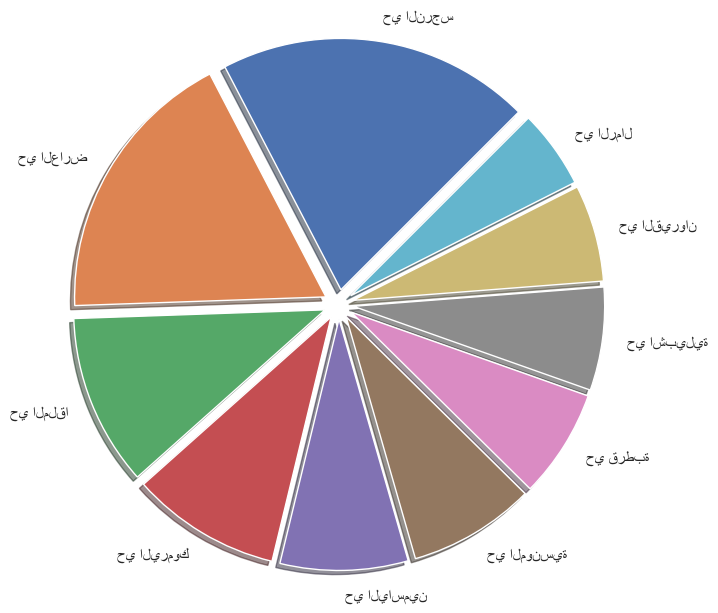

In [184]:
district = df1['district'][df1['IsRent'] == True].value_counts(ascending=False).head(10)
sns.set(style="ticks")

plt.pie(x=district.values,
        labels=district.index,
        radius=1.7,
        startangle=45,
        shadow=True,
        labeldistance=1.1,
        explode = [.1,.1,.1,.1,.1,.1,.1,.1,.1,.1]
       )
plt.show()

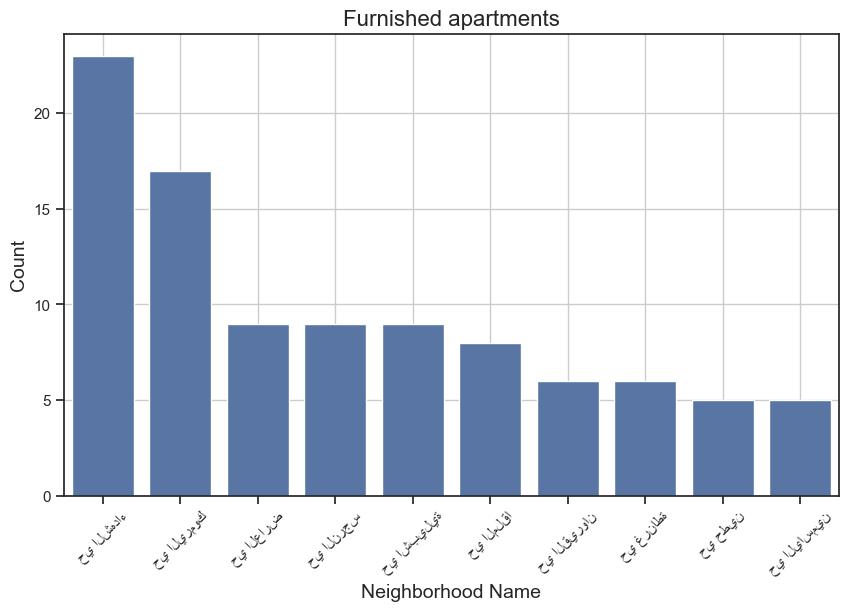

In [198]:
district1 = df1['district'][(df1['furnished'] == 'Yes') & (df1['IsRent'] == True)].value_counts(ascending=False).head(10)

sns.set(style="ticks")

plt.figure(figsize=(10, 6))

sns.barplot(x=district1.index, y=district1.values)

plt.title('Furnished apartments', fontsize=16)
plt.xlabel('Neighborhood Name', fontsize=14)
plt.ylabel('Count', fontsize=14)

plt.xticks(rotation=45)

plt.grid()
plt.show()

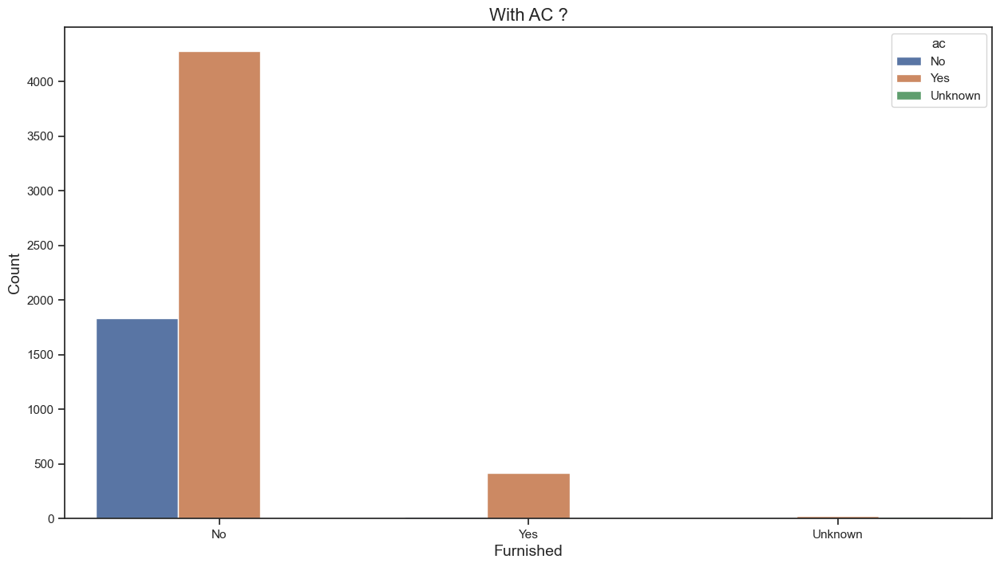

In [212]:
plt.figure(figsize=(15,8))

plt.title('With AC ?', fontsize=16)
plt.xlabel('Furnished', fontsize=14)
plt.ylabel('Count', fontsize=14)

sns.countplot(x = 'furnished', hue = 'ac', data = df1);

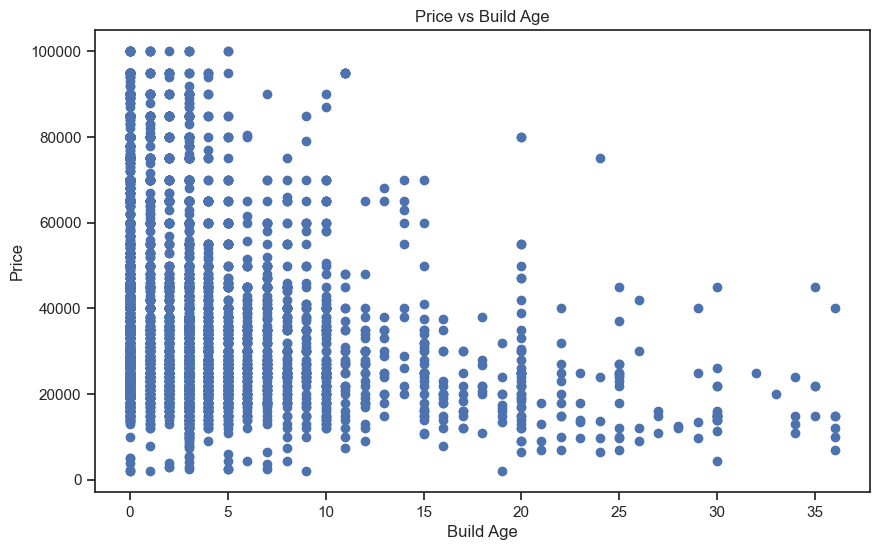

In [222]:
y = df1['price']
x = df1['age']

#Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(x, y)
plt.title('Price vs Build Age')
plt.xlabel('Build Age')
plt.ylabel('Price')
plt.show()


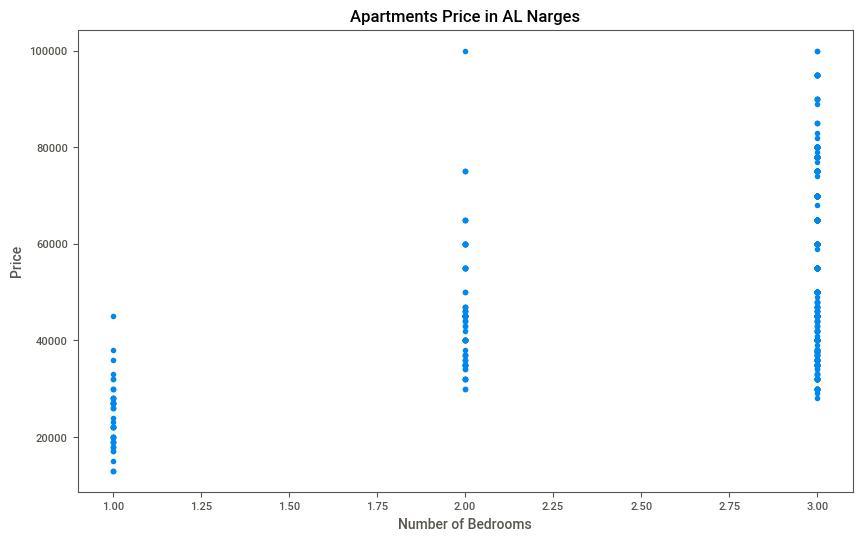

In [182]:
y = df1['price'][(df1['district'] == 'حي النرجس') & (df1['beds'] <= 3) & (df1['price'] > 5000)]
x = df1['beds'][(df1['district'] == 'حي النرجس') & (df1['beds'] <= 3) & (df1['price'] > 5000)]

plt.figure(figsize=(10, 6))
plt.scatter(x, y)
plt.title('Apartments Price in AL Narges')
plt.xlabel('Number of Bedrooms')
plt.ylabel('Price')
plt.show()
